# Clasificación estado de masas usando resultados de mamografias

Este nootebook tiene como objetivo predecir en función a las caracteristicas del nodulo (masa) la implicación de la masas mamográficas (benignas o malignas). Voy a usar diferentes algoritmos de aprendizaje automático para analizar en profundidad estos resultados, incluidos SVM, Regresión logística, Bosque aleatorio, Naive Bayes, Red neuronal artificial ...

Para identificar el mejor algoritmo para este problema, se están trazando curvas ROC.

# Problema

Según (1), El cáncer de mama es la segunda causa principal de muerte relacionada con el cáncer y el cáncer más comúnmente diagnosticado en mujeres en todo el mundo.

En donde la mamografía es el método más eficaz para la detección del cáncer de mama disponible en la actualidad y el análisis de estas imágenes es un desafío debido a las sutiles diferencias entre las lesiones y el tejido fibroglandular de fondo, los diferentes tipos de lesiones, la naturaleza no rígida de la mama y la proporción relativamente pequeña de cánceres en una población de detección de mujeres con riesgo promedio (2).


En donde los modelos de predicción del riesgo de cáncer de mama basados en características clínicas pueden ayudar a los médicos a estimar la probabilidad de que un individuo o una población desarrolle cáncer de mama dentro de ciertos períodos de tiempo.

*(1). American Cancer Society. Global Cancer Facts & Figures. 3rd ed. Atlanta, Ga: American Cancer Society, 2015. Google Scholar*

*(2) Giger ML, Karssemeijer N, Schnabel JA. Breast image analysis for risk assessment, detection, diagnosis, and treatment of cancer. Annu Rev Biomed Eng 2013;15(1):327–357. Crossref, Medline, Google Scholar*

### Base de datos

La base de datos fue proporcionada por la compañia *Davinci* *- Google cloud Partner*, en un csv llamado *_Train Cientifico de Datos*, la cual contiene 31 variables que más adelante se describirán y 569 registros de mamografias.

## Inicio del proyecto

### Librerias necesarias

In [120]:
## Tratamiento de datos
# ==============================================================================

import pandas as pd
pd.options.display.max_columns = None
import numpy as np
import datetime                              # libreria para fechas
import warnings
warnings.filterwarnings('ignore')

## Graficos
# ==============================================================================

from pandas_profiling import ProfileReport   # Reporte descriptivo del dataset
import seaborn as sns                        # libreria para graficos 
import matplotlib.pyplot as plt              # libreria para graficos

# Preprocesado y modelado
# ==============================================================================


from sklearn.linear_model import LogisticRegression # Logistic regression
from sklearn.metrics import plot_confusion_matrix # matriz de confusion
from sklearn.metrics import classification_report # reporte de metricas

from sklearn.model_selection import KFold, cross_val_score #libreria para validación cruzada
from sklearn.model_selection import GridSearchCV  #libreria para tunear los hiperparametros

from sklearn.model_selection import train_test_split #libreria para train y test
from sklearn.tree import DecisionTreeClassifier #libreria para arboles de decisión
from sklearn import tree   #libreria para visualizar arboles

from sklearn.ensemble import BaggingClassifier #libreria para bagging

from sklearn.ensemble import RandomForestClassifier #Para usar randomForest
from sklearn.model_selection import ParameterGrid #Con esto tuneamos con los grids
from sklearn.model_selection import RepeatedKFold #para validacion cruzada

import multiprocessing #para usar varios procesadores

# Importación y lectura de los modelos
# ==============================================================================
from joblib import dump #para exportar los modelos
import joblib
from joblib import load

# Evaluacion
# ==============================================================================

"==============================FUNCION PROPIA==========================================="

from utils import evaluate # Funcion creada por mi para evaluar las metricas de los modelos

### Lectura del dataset

In [4]:
path = 'C:/Users/santi/Desktop/Docs Santi/Prueba Tecnica Davinci/'

In [5]:
df1 = pd.read_excel(path + '/BBDD/_Train Cientifico de Datos.xlsx')

In [6]:
df = df1

In [7]:
print(df.shape)
df.head(20)

(569, 31)


,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,radius error,texture error,perimeter error,area error,smoothness error,compactness error,concavity error,concave points error,symmetry error,fractal dimension error,worst radius,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension,malignant
0,17.99,10.38,122.80,1001.0,1184.0,2776.00,3001.0,1471.0,2419.0,7871.0,1095.00,9053,8589,153.4,6399.0,4904,5373.0,1587.0,3003,6193,25.38,17.33,184.60,2019.0,1622.0,6656.0,7119.0,2654.0,4601.0,1189.0,0
1,20.57,17.77,132.90,1326.0,8474.0,7864.00,869.0,7017.0,1812.0,5667.0,5435.00,7339,3398,74.08,5225.0,1308,186.0,134.0,1389,3532,24.99,23.41,158.80,1956.0,1238.0,1866.0,2416.0,186.0,275.0,8902.0,0
2,19.69,21.25,130.00,1203.0,1096.0,1599.00,1974.0,1279.0,2069.0,5999.0,7456.00,7869,4585,94.03,615.0,4006,3832.0,2058.0,225,4571,23.57,25.53,152.50,1709.0,1444.0,4245.0,4504.0,243.0,3613.0,8758.0,0
3,11.42,20.38,77.58,386.1,1425.0,2839.00,2414.0,1052.0,2597.0,9744.0,4956.00,1156,3445,27.23,911.0,7458,5661.0,1867.0,5963,9208,14.91,2020-05-26 00:00:00,98.87,567.7,2098.0,8663.0,6869.0,2575.0,6638.0,173.0,0
4,20.29,14.34,135.10,1297.0,1003.0,1328.00,198.0,1043.0,1809.0,5883.0,7572.00,7813,5438,94.44,1149.0,2461,5688.0,1885.0,1756,5115,22.54,16.67,152.20,1575.0,1374.0,205.0,0.4,1625.0,2364.0,7678.0,0
5,12.45,2020-07-15 00:00:00,82.57,477.1,1278.0,0.17,1578.0,8089.0,2087.0,7613.0,3345.00,8902,2217,27.19,751.0,3345,3672.0,1137.0,2165,5082,15.47,23.75,103.40,741.6,1791.0,5249.0,5355.0,1741.0,3985.0,1244.0,0
6,18.25,19.98,119.60,1040.0,9463.0,109.00,1127.0,74.0,1794.0,5742.0,4467.00,7732,3.18,53.91,4314.0,1382,2254.0,1039.0,1369,2179,22.88,27.66,153.20,1606.0,1442.0,2576.0,3784.0,1932.0,3063.0,8368.0,0
7,13.71,20.83,90.20,577.9,1189.0,1645.00,9366.0,5985.0,2196.0,7451.0,5835.00,1377,3856,50.96,8805.0,3029,2488.0,1448.0,1486,5412,2020-06-17 00:00:00,28.14,110.60,897.0,1654.0,3682.0,2678.0,1556.0,3196.0,1151.0,0
8,13.0,21.82,87.50,519.8,1273.0,1932.00,1859.0,9353.0,235.0,7389.0,3063.00,1002,2406,24.32,5731.0,3502,3553.0,1226.0,2143,3749,15.49,30.73,106.20,739.3,1703.0,5401.0,539.0,206.0,4378.0,1072.0,0
9,12.46,2020-04-24 00:00:00,83.97,475.9,1186.0,2396.00,2273.0,8543.0,203.0,8243.0,2976.00,1599,2039,23.94,7149.0,7217,7743.0,1432.0,1789,1008,2020-09-15 00:00:00,40.68,97.65,711.4,1853.0,1058.0,1105.0,221.0,4366.0,2075.0,0


In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 31 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   mean radius              569 non-null    object 
 1   mean texture             569 non-null    object 
 2   mean perimeter           569 non-null    float64
 3   mean area                569 non-null    float64
 4   mean smoothness          569 non-null    float64
 5   mean compactness         569 non-null    float64
 6   mean concavity           569 non-null    float64
 7   mean concave points      569 non-null    float64
 8   mean symmetry            569 non-null    float64
 9   mean fractal dimension   569 non-null    float64
 10  radius error             569 non-null    float64
 11  texture error            569 non-null    object 
 12  perimeter error          569 non-null    object 
 13  area error               569 non-null    object 
 14  smoothness error         5

### Reporte descriptivo inicial

In [9]:
#profile = ProfileReport(df, title = "Dataset_Report")

#profile.to_file(path + '/Dataset_Report.html')

##### De acuerdo con el reporte inicial:

Tratamiento especifico de algunas variables:

**Variables con doble formato que en el Feature Engineering trataremos y analizaremos de nuevo**

1. mean radius
2. mean texture
3. texture error
4. perimeter error
5. area error
6. worst radius
7. worst texture

Hay variables que tienden a tener distribuciones asimetricas como *mean perimeter, mean area, mean concavity, smoothness error (Parece tener una distribución bimodal), compactness error.*

Hay variables con posibles valores atipicos que tendremos que tratar como *mean smoothness, mean symmetry, mean fractal dimension, symmetry error, worst symmetry.*

Nuestra variable **target: malignant** tiene una buena distribución, pues no son pocos los casos de masas malignas o benignas; si no hubiese sido el caso, tendriamos que trabajar con tecnicas de remuestreo (Upsampling, Downsamplig, Smote) y comparar los diferentes kpis. Esta variable la tratare como:
     
     0: Masa benigna.
     1: Masa maligna.


### Preparación del data set

In [10]:
print('Cantidad de duplicados en el dataframe:', df.duplicated().sum())
print('Cantidad de valores faltantes en el dataframe:', df.isnull().sum())

Cantidad de duplicados en el dataframe: 0
Cantidad de valores faltantes en el dataframe: mean radius                0
mean texture               0
mean perimeter             0
mean area                  0
mean smoothness            0
mean compactness           0
mean concavity             0
mean concave points        0
mean symmetry              0
mean fractal dimension     0
radius error               0
texture error              0
perimeter error            0
area error                 0
smoothness error           0
compactness error          0
concavity error            0
concave points error       0
symmetry error             0
fractal dimension error    0
worst radius               0
worst texture              0
worst perimeter            0
worst area                 0
worst smoothness           0
worst compactness          0
worst concavity            0
worst concave points       0
worst symmetry             0
worst fractal dimension    0
malignant                  0
dtype: int64

#### El dataset no tiene valores faltantes o duplicados

### Feature Engineering



Vamos a tratar primero las variables con doble formato, para ella, analizaremos una por una y procederemos:

Se observa que las variables tienen varios tipos de anomalias:

    1. Hay registros que tienen fechas 
    2. Hay registros que no tienen el decimal.
    3. Hay registros con formatos diferentes
    
En una situación laboral, se le preguntaría al ingeniero de datos que está pasando con esas variables, si es por algun error en la consulta. Y de ser el caso, se le preguntaría a el negocio si ello tiene alguna explicación.

Se tienen varios escenarios para tratar estas variables:

1. Se observa en el excel que los registros con formato fecha tiene una concordancia con el posible numero. Ej:
16/02/2020 (Formato fecha) = 16.02 (Numero que aparece en excel del formato especial). En donde el dia concuerda con los 2 primeros numeros y el mes con los ultimos 2, por lo cual se podría llegar a este numero apartir de la fecha proporcionada. 
2. Los registros que no tienen decimales o tienen un formato diferente son los más delicados, pues no hay indicios de como transformarlo, se podria pensar en multiplicarlos por 1000 o sumarle la media. Por lo cual se podrián tratar en un inicio como 'datos normales' y en la detección de atipicos se identifiquen para truncarlos con la mediana.(La mediana pues la mayoria de distribuciones son asimetricas).
3. Se podrían eliminar todos estos valores.
4. Se podrian truncar con la mediana o la media.

**Para este proceso, optaré por el escenario 4 ya que al no tener certeza de lo que pasó es la manera más transparente de proceder pero solo para los registros con datos de fecha, las otras anomalias se tratarán en el tratamiento de atipicos. OJO: Esto podría en la realidad afectar los modelos, pero a manera de ejercicio es interesante abordarlo así.**


Comentario: Aproximadamente por cada variable con doble tipo, hay un 20% de fechas, es decir, un 20% de los registros se tendrían que imputar lo cual es mucho, pero si los elimino, me quedaría con muy poca información.

In [11]:
#Selección de las variables con los formatos de Fecha:

vf = df[['mean radius', 'mean texture', 'texture error', 'perimeter error', 'area error', 'worst radius', 'worst texture']]
names = ['mean radius', 'mean texture', 'texture error', 'perimeter error', 'area error', 'worst radius', 'worst texture']

In [12]:
vf[names] = vf[names].astype(str)
#Saco aparte las variables que voy a tratar y las convierto en str para usar len 

In [13]:
for x in vf:
    
    vf[x] = np.where(vf[x].str.len() > 10, 0, vf[x])
    vf[x] = np.where(vf[x] == 0, vf[x].median() , vf[x])
    
# hago un for para que a los registros con un len > 10 les ponga 0 para después imputarlos con la mediana

In [14]:
df['mean radius'] = vf['mean radius']
df['mean texture'] = vf['mean texture']
df['texture error'] = vf['texture error']
df['perimeter error'] = vf['perimeter error']
df['area error'] = vf['area error']
df['worst radius'] = vf['worst radius']
df['worst texture'] = vf['worst texture']

#Reemplazo los valores imputados en la base original

In [15]:
for x in df:
    
    df[x] = df[x].astype(float)

#Convierto todas las variables en float

#### Manejo de datos atipicos

In [16]:
df.quantile(np.arange(0,1 + 0.001,0.05)) 

,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,radius error,texture error,perimeter error,area error,smoothness error,compactness error,concavity error,concave points error,symmetry error,fractal dimension error,worst radius,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension,malignant
0.00,7.760,9.710,43.790,143.50,0.1,0.06,0.0,0.0,0.18,0.06,0.21,0.780,1.170,10.210,0.01,12.0,0.0,0.0,15.0,6.0,7.930,12.490,50.410,185.20,0.13,0.1,0.0,0.0,0.21,0.12,0.0
0.05,10.892,13.186,60.496,275.78,802.0,530.40,114.6,145.0,182.40,613.00,289.60,1.752,7.024,13.056,599.20,318.0,172.6,132.8,187.0,316.6,11.164,16.930,67.856,331.06,145.40,243.8,154.2,177.4,256.00,786.00,0.0
0.10,11.418,14.648,65.830,321.60,1003.0,1035.60,489.6,396.2,1195.80,782.20,1007.20,1010.800,1164.800,15.240,1018.60,1064.8,682.2,680.2,384.6,1118.2,11.974,18.822,72.178,384.72,1016.80,993.8,527.8,749.8,326.20,1025.60,0.0
0.15,11.760,15.452,70.670,371.18,1026.0,1114.60,1056.6,1089.8,1434.00,5379.00,1403.20,1052.200,1334.800,17.252,1207.00,1174.0,1136.2,1038.0,1186.2,1532.2,12.696,19.778,77.984,440.08,1081.60,1214.2,1101.8,1054.4,1987.20,1108.20,0.0
0.20,12.262,16.198,73.292,396.56,1047.2,1183.40,1189.8,1250.6,1506.00,5533.60,1739.40,1145.400,1447.800,18.450,2136.20,1312.2,1344.8,1108.2,1317.2,1725.6,13.286,21.186,81.402,475.98,1123.60,1397.6,1353.8,1170.6,2244.60,1291.80,0.0
0.25,12.650,16.850,75.170,420.30,1071.0,1289.00,1357.0,1471.0,1555.00,5636.00,1916.00,1213.000,1539.000,19.750,3704.00,1442.0,1535.0,1183.0,1389.0,1906.0,13.640,22.350,84.110,515.30,1166.00,1574.0,1521.0,1339.0,2355.00,6037.00,0.0
0.30,12.968,17.530,77.360,444.06,1097.2,1346.80,1520.2,1775.8,1599.20,5701.80,2126.20,1301.000,1667.000,20.950,4255.40,1572.6,1758.4,1269.0,1466.4,2113.6,13.940,23.342,86.328,544.14,1213.00,1730.4,1761.0,1465.4,2440.60,6475.00,0.0
0.35,12.980,17.570,79.006,466.66,1146.8,1528.20,1658.6,1960.8,1634.80,5845.40,2267.60,1374.600,1815.400,22.918,4594.80,1774.4,1975.8,1344.6,1536.0,2280.4,13.940,23.840,88.172,564.76,1234.00,1849.8,1926.6,1598.2,2522.80,6761.00,0.0
0.40,12.980,17.570,81.938,496.44,1228.8,1682.80,1897.0,2260.0,1669.40,5907.00,2442.00,1476.400,1959.400,24.680,4952.20,1940.8,2120.4,1450.0,1616.2,2476.2,13.940,23.840,91.304,599.70,1272.60,2002.2,2285.2,1739.4,2597.40,6927.60,1.0
0.45,12.980,17.570,84.066,518.28,6979.0,2046.60,2086.2,2508.8,1714.00,5976.60,2576.20,1596.200,2102.600,24.680,5291.00,2128.8,2429.0,1568.2,1701.0,2669.8,13.940,23.840,94.352,633.62,1297.00,2165.8,2575.4,1913.4,2676.60,7093.00,1.0


### Identificar valores atipicos

Planteamos criterios independientes para cada variable a la hora de definir el atipico, depende de la naturaleza de la variable y su distribución. 

Reglas identificación valores atipícos por variable.

- mean radius: por encima del 90%
- mean texture: por debajo del 5% y por arriba del 95%
- mean perimeter: por arriba del 95%
- mean area: por arriba del 95%
- mean smoothness: por debajo del 5%
- mean compactness: por debajo del 5%
- mean concavity: por debajo del 10%
- mean concave points: por debajo del 10%
- mean symmetry: por debajo del 10% y por arriba del 99%
- mean fractal dimension: por debajo del 15% y por arriba del 98%
- radius error: por debajo del 10%
- texture error: por debajo del 10%
- perimeter error: por debajo del 10% y por arriba del 95%
- area error: por debajo del 10% y por arriba del 95%
- smoothness error: por debajo del 10%
- compactness error: por debajo del 10%
- concavity error: por debajo del 30%
- concave points error: por debajo del 20%
- symmetry error: por debajo del 10% y por arriba del 95%
- fractal dimension error: por debajo del 10% y por arriba del 95%
- worst radius: por debajo del 5% y por arriba del 95%
- worst texture: por debajo del 5% y por arriba del 95%
- worst perimeter: por arriba del 95%
- worst area: por debajo del 5% y por arriba del 95%
- worst smoothness:  por debajo del 5% y por arriba del 90%
- worst compactness: por debajo del 10%
- worst concavity: por debajo del 10%
- worst concave points: por debajo del 10%
- worst symmetry: por debajo del 10%
- worst fractal dimension: por debajo del 10%



##### Determinar que hacer con esos atipicos: Vamos a truncar los valores con la mediana.

In [17]:
#Creamos el diccionario de limites superiores e inferiores para asignar cada valor y correr un for:

percent_sup_trunc = {'mean radius'   : 0.90  , 'mean texture'            : 0.95, 'mean perimeter'          : 0.95,
                     'mean area'     : 0.95  , 'mean symmetry'           : 0.99, 'mean fractal dimension'  : 0.98,
                     'symmetry error': 0.95  , 'fractal dimension error' : 0.95, 'worst perimeter'         : 0.95,
                     'worst area'    : 0.95  , 'worst smoothness'        : 0.90, 'perimeter error'         : 0.95,
                     'area error'    : 0.95  , 'worst radius'            : 0.95, 'worst texture'           : 0.95}

percent_inf_trunc = {'mean smoothness'        : 0.05,    'mean compactness'       : 0.05, 'mean concavity'         : 0.10, 
                     'mean concave points'    : 0.10,    'mean symmetry'          : 0.10, 'mean fractal dimension' : 0.15,
                     'radius error'           : 0.10,    'smoothness error'       : 0.10, 'compactness error'      : 0.10,
                     'concavity error'        : 0.30,    'concave points error'   : 0.20, 'symmetry error'         : 0.10,
                     'fractal dimension error': 0.10,    'worst area'             : 0.05, 'worst smoothness'       : 0.95,
                     'worst compactness'      : 0.10,    'worst concavity'        : 0.10, 'worst concave points'   : 0.10,
                     'worst symmetry'         : 0.10,    'worst fractal dimension': 0.10, 'mean texture'           : 0.05,
                     'texture error'          : 0.10,    'perimeter error'        : 0.10, 'area error'             : 0.10,
                     'worst radius'           : 0.05,    'worst texture'          : 0.05}

In [18]:
# Creamos el for, en donde x es la variable y p el quantile. Se le agrega la condición de truncar cuando sea superior a el limite
#Entonces para este caso: Lo que sea superior al quantil definido, se le podrá la mediana
for x,p in percent_sup_trunc.items():
    
    print(x,p)
    limit = df[x].quantile(p)
    df[x] = np.where(df[x] >= limit , df[x].median(), df[x]) 

mean radius 0.9
mean texture 0.95
mean perimeter 0.95
mean area 0.95
mean symmetry 0.99
mean fractal dimension 0.98
symmetry error 0.95
fractal dimension error 0.95
worst perimeter 0.95
worst area 0.95
worst smoothness 0.9
perimeter error 0.95
area error 0.95
worst radius 0.95
worst texture 0.95


In [19]:
#Para este caso: Lo que sea inferior al quantil definido, se le podrá el limite del quintil

for x,p in percent_inf_trunc.items():
    
    print(x,p)
    limit = df[x].quantile(p)
    df[x] = np.where(df[x] <= limit , limit, df[x])
    

mean smoothness 0.05
mean compactness 0.05
mean concavity 0.1
mean concave points 0.1
mean symmetry 0.1
mean fractal dimension 0.15
radius error 0.1
smoothness error 0.1
compactness error 0.1
concavity error 0.3
concave points error 0.2
symmetry error 0.1
fractal dimension error 0.1
worst area 0.05
worst smoothness 0.95
worst compactness 0.1
worst concavity 0.1
worst concave points 0.1
worst symmetry 0.1
worst fractal dimension 0.1
mean texture 0.05
texture error 0.1
perimeter error 0.1
area error 0.1
worst radius 0.05
worst texture 0.05


### Graficos

In [20]:
var = df.columns
target = 'malignant'

In [21]:
cuanti_vars = df.drop(columns = target).columns

In [22]:
(
    df
    .groupby([target])[cuanti_vars]
    .agg(['mean', np.std])
)

mean radius           mean texture           mean perimeter  \
                 mean       std         mean       std           mean   
malignant                                                               
0.0         15.796368  2.858682    20.031755  2.815256     106.324151   
1.0         12.680420  1.242398    17.460734  2.721474      78.075406   

                       mean area             mean smoothness               \
                 std        mean         std            mean          std   
malignant                                                                   
0.0        17.083559  831.880660  258.787201     4006.632075  3933.743509   
1.0        11.807438  462.790196  134.287118     6242.067227  3591.422050   

          mean compactness              mean concavity               \
                      mean          std           mean          std   
malignant                                                             
0.0            2494.356604  2402.972707    2693.893396  2513.945011   
1.0            4892.974790  2909.343939    3530.287955  2437.934293   

          mean concave points              mean symmetry              \
                         mean          std          mean         std   
malignant                                                              
0.0               5156.239623  3257.593629   1857.444340  293.103974   
1.0               2855.354622  2010.284693   1666.628571  278.358338   

          mean fractal dimension             radius error               \
                            mean         std         mean          std   
malignant                                                                
0.0                  6142.202830  677.033305  4519.714151  2532.538786   
1.0                  6124.969188  566.419988  2660.100840  1223.726794   

          texture error              perimeter error              area error  \
                   mean          std            mean          std       mean   
malignant                                                                      
0.0         3673.641509  3267.871979     3301.863208  1380.954172  61.087217   
1.0         3624.452661  3009.235384     1973.643137   746.084125  23.094566   

                     smoothness error              compactness error  \
                 std             mean          std              mean   
malignant                                                              
0.0        34.129093      5249.177358  2421.611897       3117.605660   
1.0         7.652315      5126.463866  2582.567300       3199.084594   

                       concavity error              concave points error  \
                   std            mean          std                 mean   
malignant                                                                  
0.0        1837.373880     3780.781132  1779.409022          2471.121698   
1.0        2551.207364     3214.649300  2091.308122          4105.641457   

                       symmetry error             fractal dimension error  \
                   std           mean         std                    mean   
malignant                                                                   
0.0        2430.357080    1700.947170  623.675076             3296.539623   
1.0        3092.622114    1802.541737  744.982548             2804.549020   

                       worst radius           worst texture            \
                   std         mean       std          mean       std   
malignant                                                               
0.0        1434.433559    18.903302  4.089469     27.562217  4.283401   
1.0        1308.785249    13.701333  1.504049     23.467031  4.232479   

          worst perimeter              worst area              \
                     mean        std         mean         std   
malignant                                                       
0.0            128.125236  22.777174  1169.760377  401.206588   
1.0            

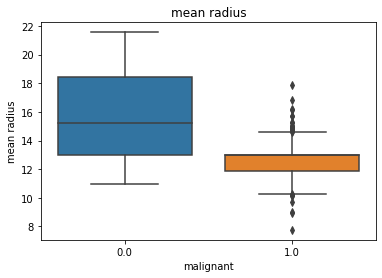

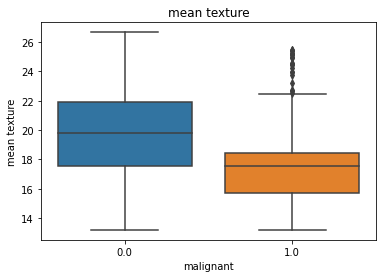

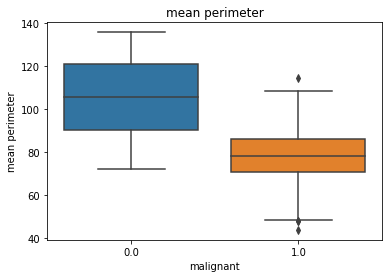

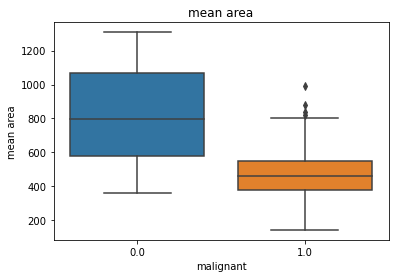

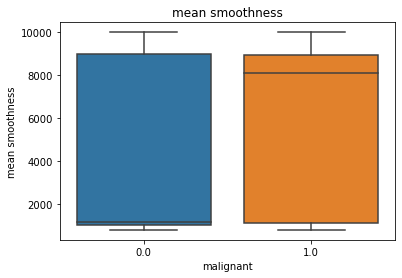

...

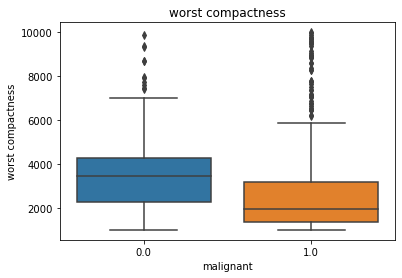

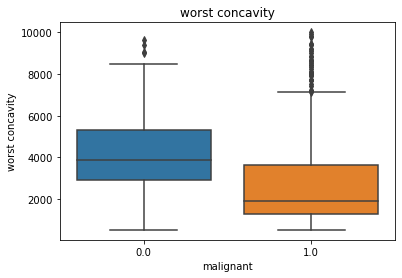

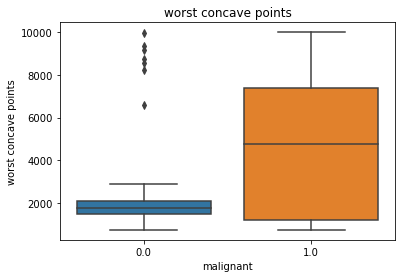

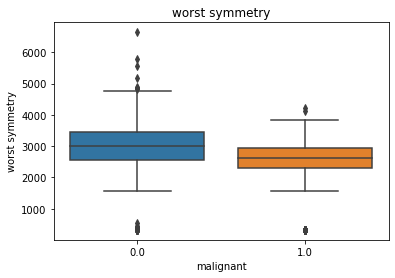

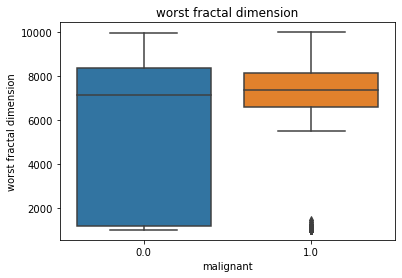

In [23]:
print("=========================================================================")
for x in cuanti_vars:
    sns.boxplot(x = target, y = x, data = df)
    plt.title(x)
    plt.show()
    print("=========================================================================")

#### Analisis graficos: El comportamiento de los posibles atipicos se ha corregido por el detallado manejo de los quantiles. Hay variables interesantes como el Worst fractal dimension en los casos de masas malignas o el area error en los mismos casos o el perimetro, que existe una diferencia notable de medias o el mean perimetre, que sus distribuciones son diferentes.


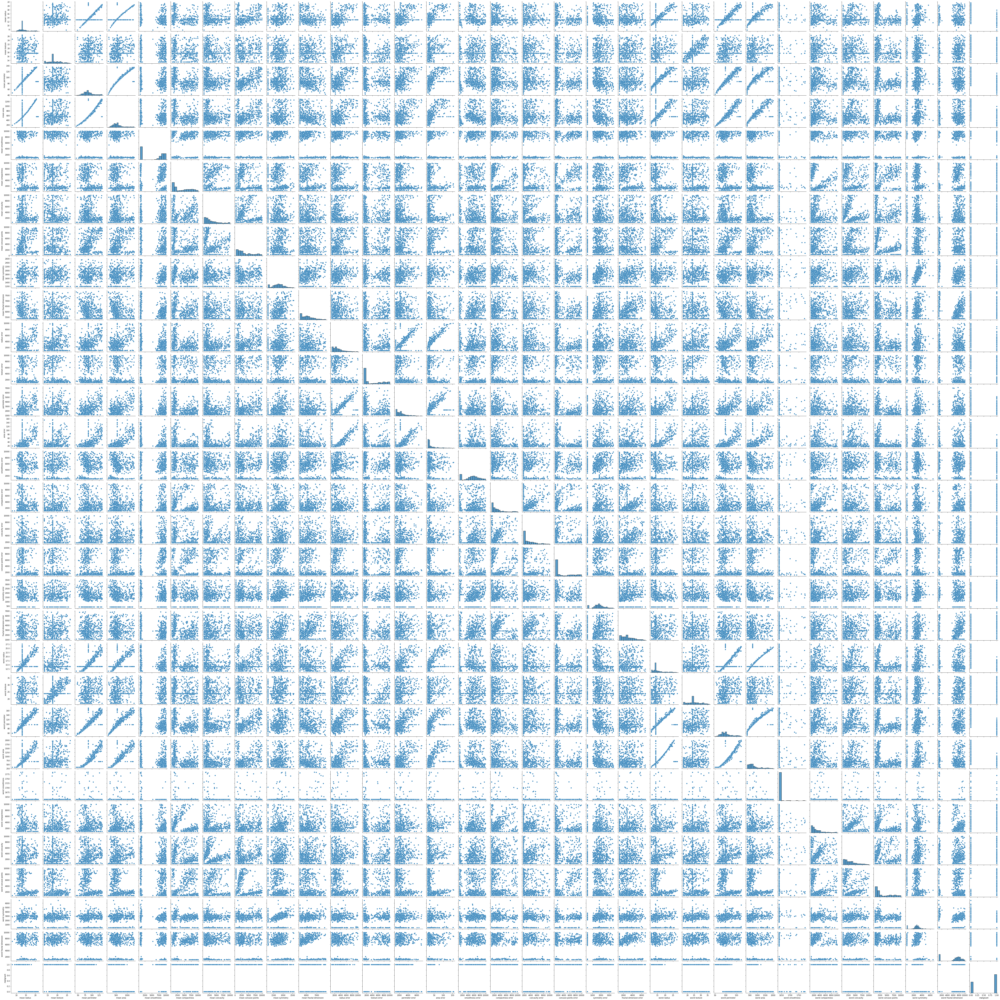

In [24]:
sns.pairplot(data = df)
plt.show()

#### Analisis de graficos: Hay comportamientos que son muy particulares, como lo es el caso de las 7 variables que tenian el formato fecha y se imputaron con la mediana, esto me da cabida a suguerir un metodo diferente de imputación que en lo personal no he trabajado con ellos pues prefiero no imputar, pero dado el caso del ejercicio y al tener tan pocos registros es una alternativa. El punto positivo es que hay 23 variables que no tuvieron este tratamiento y al usar algoritmos de ML el impacto por el numero de variables podria ser menor.

<AxesSubplot:>

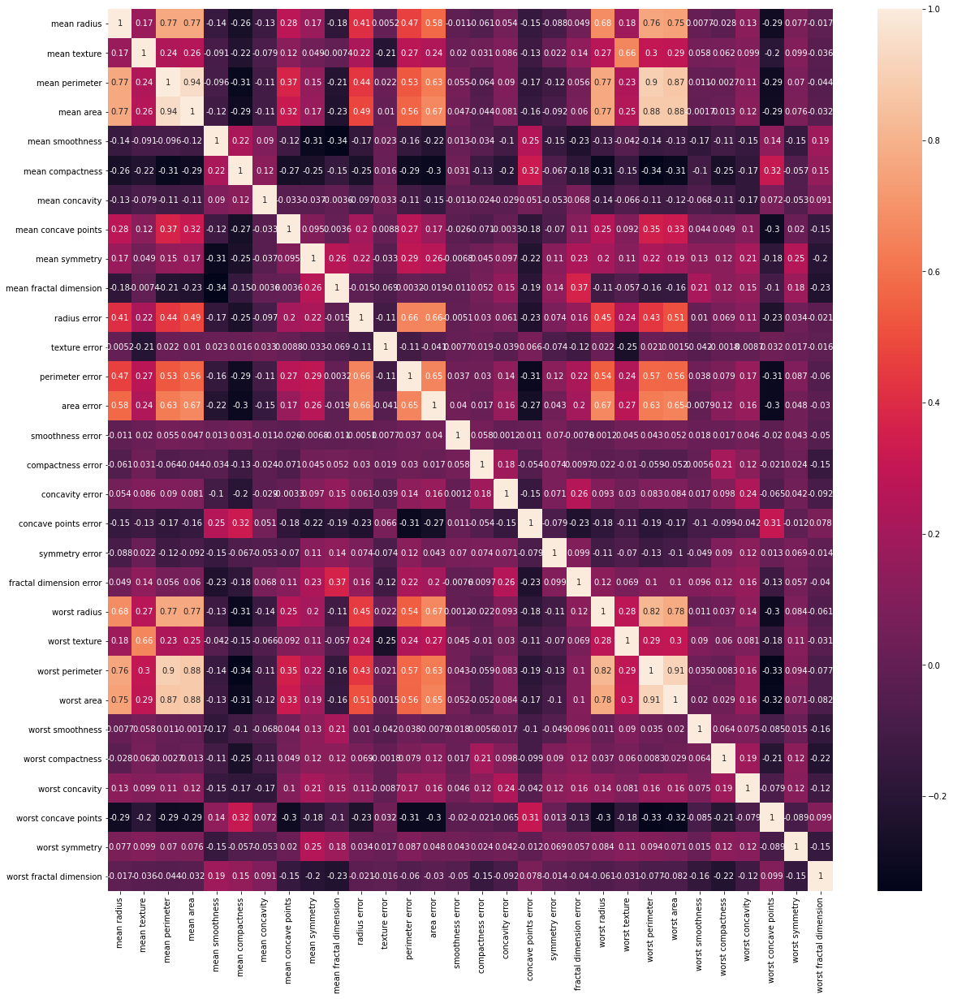

In [25]:
#Ahora veamos las correlaciones de las variables.

fig, ax = plt.subplots(figsize=(20,20)) 
sns.heatmap(df.drop(columns = target).corr(), annot = True, ax = ax) 

#### Hay variables con un alto grado de correlación:

1. Mean perimetre con mean area
2. Worst perimetre con Worst area
3. Worst radius con worts area
4. Mean perimetre con Worst perimetre

Hay quienes afirman que para un implementar un random forest, un arbol aleatorio,. etc los problemas de multicolinealidad no afectan ya que no son del todo modelos lineales, pero en mi criterio siempre se debe preocuparse por la colinealidad, independientemente de que el modelo / método sea lineal o no, o la tarea principal sea la predicción o clasificación.

Esto puede afectar a un random forest por ejemplo en la selección aleatoria ya que puede elegir solo (o principalmente) características colineales que pueden terminar en una división pobre, y esto puede suceder repetidamente, lo que afecta negativamente el rendimiento.

**Por lo cual eliminaré las variables que tienen un alto grado de correlación y dejaré la más importante a mi criterio.**

In [26]:
cols_drop = ['mean perimeter' , 'worst perimeter', 'worst area']
    
df.drop(columns = cols_drop, inplace = True)

#Seleccioné como criterio, eliminar variables cuando la correlación estuviese por arriba del 75%. Las correlaciones negativas 
# no fueron tan significativas como las positivas

## Preparación de datos para modelado:

In [27]:
X = df.drop(columns = target)
y = df[target]

In [28]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = 42)

#Con esto dividimos el train y el test

print(X_train.shape)
print(X_test.shape)

(398, 27)
(171, 27)


In [29]:
y.head()

0    0.0
1    0.0
2    0.0
3    0.0
4    0.0
Name: malignant, dtype: float64

In [30]:
X_train.head()

,mean radius,mean texture,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,radius error,texture error,perimeter error,area error,smoothness error,compactness error,concavity error,concave points error,symmetry error,fractal dimension error,worst radius,worst texture,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension
149,13.74,17.91,585.0,7944.0,6376.0,2881.0,1329.0,1473.0,5379.0,1007.2,7574.0,1573.0,21.47,2838.0,1592.0,1758.4,5828.0,1329.0,1976.0,15.34,22.46,1635.8,1824.0,1564.0,6019.0,326.2,7014.0
124,13.37,16.39,553.5,7115.0,7325.0,8092.0,396.2,1422.0,5823.0,1639.0,1010.8,1223.0,15.24,5919.0,1064.8,4957.0,1108.2,1208.0,4076.0,14.26,22.75,1635.8,2531.0,3308.0,8978.0,2048.0,7628.0
421,14.69,13.98,656.1,1031.0,1836.0,489.6,396.2,2086.0,7406.0,5462.0,1511.0,4795.0,49.45,9976.0,5244.0,5278.0,1108.2,2653.0,5444.0,16.46,18.34,1635.8,3635.0,3219.0,1108.0,2827.0,9208.0
195,12.91,16.33,516.4,7941.0,5366.0,3873.0,2377.0,1829.0,5667.0,1942.0,9086.0,1493.0,15.75,5298.0,1587.0,2321.0,1108.2,1853.0,2152.0,13.88,22.00,1635.8,1506.0,1764.0,8235.0,3024.0,6949.0
545,13.62,23.23,573.2,9246.0,6747.0,2974.0,2443.0,1664.0,5801.0,1007.2,1336.0,2066.0,31.24,5868.0,2099.0,2021.0,9064.0,2087.0,2583.0,15.35,23.84,1635.8,1517.0,1049.0,7174.0,2642.0,6953.0


In [31]:
# exportemos la base de train y test, lo exportamos en parquet: archivo binario de python

X_train.to_parquet(path + 'BBDD/X_train.parquet', index = False, engine = 'pyarrow')
pd.DataFrame(y_train).to_parquet(path + 'BBDD/y_train.parquet', index = False, engine = 'pyarrow')

X_test.to_parquet(path + 'BBDD/X_test.parquet', index = False, engine = 'pyarrow')
pd.DataFrame(y_test).to_parquet(path + 'BBDD/y_test.parquet', index = False, engine = 'pyarrow')

### Modelado

### Vamos a iniciar con una clasica regresión logistica:

La regresión logística es rápida y relativamente sencilla de aplicar, y es conveniente para interpretar los resultados de los betas, por lo cual considero siempre debe de ser una opción en un problema supervisado. Aunque es esencialmente un método de clasificación binaria, también se puede aplicar a problemas multiclase.

In [122]:
path = 'C:/Users/santi/Desktop/Docs Santi/Prueba Tecnica Davinci/'
target = 'malignant'

In [123]:
X_train = pd.read_parquet(path + 'BBDD/X_train.parquet')
y_train = pd.read_parquet(path + 'BBDD/y_train.parquet')

X_test  = pd.read_parquet(path + 'BBDD/X_test.parquet')
y_test  = pd.read_parquet(path + 'BBDD/y_test.parquet')

y_train = y_train[target]
y_test  = y_test[target]

In [124]:
lr = LogisticRegression(C = 1e6, max_iter = 200)
# C es un número de punto flotante positivo (1.0 por defecto) que define la fuerza relativa de la regularización. Los valores más pequeños indican una regularización más fuerte.
# max_iteres un número entero (100 por defecto) que define el número máximo de iteraciones del solucionador durante el ajuste del modelo.

#Use C = 1000000 ya que no me interesa que el modelo tenga alta penalidad en regularización, pues al ser logistico, el sobreajuste
#que pueda presentar por esto es poco.

lr.fit(X_train, y_train)

LogisticRegression(C=1000000.0, max_iter=200)

### Evaluación

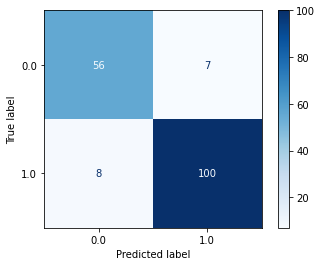

In [125]:
plot_confusion_matrix(lr, X_test, y_test, cmap = 'Blues')

In [126]:
y_pred = lr.predict(X_test)
y_proba = lr.predict_proba(X_test)[:,1]

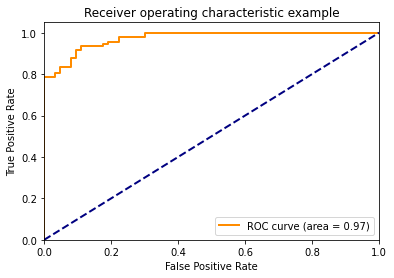

{'recall': 0.9259259259259259,
 'precision': 0.9345794392523364,
 'f1': 0.9302325581395349,
 'accuracy': 0.9122807017543859,
 'auc': 0.9736919459141681}

In [127]:
metrics = evaluate(y_test, y_pred, y_proba)
metrics

In [128]:
dump(lr, path + 'MODELOS/logistic_regression.pkl')

['C:/Users/santi/Desktop/Docs Santi/Prueba Tecnica Davinci/MODELOS/logistic_regression.pkl']

#### Para la evaluación del modelo usé el:

1. Recall: Sobre los pronosticos de masa maligna, me dice que % de masa maligna el modelo captura correctamente
2. Precision: Sobre los pronosticos de masa maligna, me dice que % es realmente masa maligna
3. f1 score: Tiene en cuenta el precion y el recall, y asume que nos importa de igual forma la precisión y el recall.
4. accuracy: Me dice el % de pacientes clasificados correctamente respecto a su masa
5. auc: Curva Roc, Nos representa la sensibilidad (verdaderos positivos) frente a 1 - la especificidad (Falsos positivos). Si el auc es del 100% la clasificación es perfecta

**El modelo presenta muy buen ajuste, tiene metricas muy constantes, tiene un auc del 97% y un f1 score del 93%.**

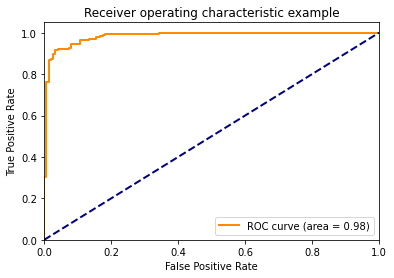

{'recall': 0.963855421686747,
 'precision': 0.9375,
 'f1': 0.9504950495049506,
 'accuracy': 0.9371859296482412,
 'auc': 0.9834236273954879}

In [129]:
# con train
y_pred = lr.predict(X_train)
y_proba = lr.predict_proba(X_train)[:,1]

evaluate(y_train, y_pred, y_proba)

### Evaluamos el modelo con el train y las metricas se mantienen, es decir que el modelo no se está sobreajustando. El sobreajuste en las regresiones logisticas se da en gran medida cuando hay multicolinealidad o una dependencia lineal.

### Validación cruzada

In [130]:
# prepare configuration for cross validation test harness
seed    = 7
model   = LogisticRegression(max_iter = 200, C = 1e6)
scoring = 'precision'

kfold = KFold(n_splits = 10, shuffle = True, random_state = seed)
cv_results = cross_val_score(model, X_train, y_train, cv = kfold, scoring = scoring)

In [131]:
cv_results

array([0.95652174, 0.9       , 0.92592593, 0.91666667, 0.88461538,
       0.96153846, 0.82608696, 0.84      , 1.        , 0.90909091])

### Tuneo regularización


In [132]:
model   = LogisticRegression(max_iter = 200)
scoring = {'recall': 'recall',
           'precision': 'precision',
           'f1': 'f1',
           'accuracy':'accuracy'}

grid = {'C': [1000, 500, 400, 300, 350, 320, 200, 100, 10, 0.1]}

grid_search = GridSearchCV(estimator = model, 
                           param_grid = grid, 
                           n_jobs = -1,
                           cv = 5,
                           scoring = scoring,
                           refit = 'precision'
                           )

In [133]:
grid_search.fit(X_train, y_train)

GridSearchCV(cv=5, estimator=LogisticRegression(max_iter=200), n_jobs=-1,
             param_grid={'C': [1000, 500, 400, 300, 350, 320, 200, 100, 10,
                               0.1]},
             refit='precision',
             scoring={'accuracy': 'accuracy', 'f1': 'f1',
                      'precision': 'precision', 'recall': 'recall'})

In [134]:
print("Best: %f using %s" % (grid_search.best_score_, grid_search.best_params_))

Best: 0.920447 using {'C': 320}


In [135]:
lr_r = LogisticRegression(max_iter = 200, C = 320)
lr_r.fit(X_train, y_train)

LogisticRegression(C=320, max_iter=200)

### Evaluación

In [136]:
y_pred  = lr_r.predict(X_test)
y_proba = lr_r.predict_proba(X_test)[:,1]

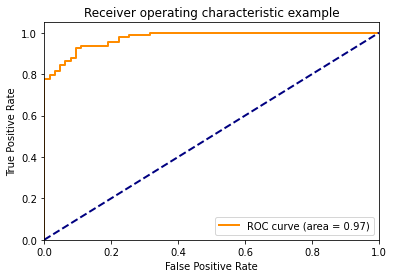

{'recall': 0.9259259259259259,
 'precision': 0.9345794392523364,
 'f1': 0.9302325581395349,
 'accuracy': 0.9122807017543859,
 'auc': 0.9747207524985303}

In [137]:
metrics = evaluate(y_test, y_pred, y_proba)
metrics

In [138]:
dump(lr_r, path + 'MODELOS/logistic_regression_regularized.pkl')

['C:/Users/santi/Desktop/Docs Santi/Prueba Tecnica Davinci/MODELOS/logistic_regression_regularized.pkl']

### Comparación de los modelos por precision

LR: 0.912045 (0.050856)
LRR: 0.902018 (0.049705)


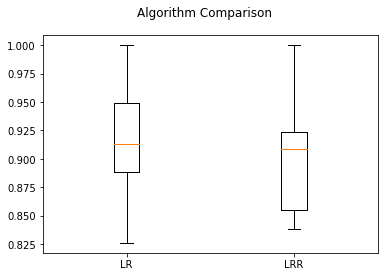

In [44]:
# prepare models
models = []
models.append( ('LR', LogisticRegression(max_iter = 200, C = 1e6)) )
models.append( ('LRR', LogisticRegression(max_iter = 200, C = 0.0001)) )

# evaluate each model in turn
results = []
names = []
scoring = 'precision'

for name, model in models:
    kfold = KFold(n_splits = 10, shuffle = True, random_state = seed)
    cv_results = cross_val_score(model, X_train, y_train, cv = kfold, scoring = scoring)
    results.append(cv_results)
    names.append(name)
    msg = "%s: %f (%f)" % (name, cv_results.mean(), cv_results.std())
    print(msg)
    
# boxplot algorithm comparison
fig = plt.figure()
fig.suptitle('Algorithm Comparison')
ax = fig.add_subplot(111)
plt.boxplot(results)
ax.set_xticklabels(names)
plt.show()

#### Ambos modelos tiene buenas metricas, pero el logistico regularizado tiene menor disperción en el precisión, por lo cual está capturando mayor % de pronostico de los de masa maligna sobre los que si tienen esta masa.

### Decision tree

In [47]:
dt = DecisionTreeClassifier()
dt.fit(X_train, y_train)

DecisionTreeClassifier()

In [48]:
y_pred = dt.predict(X_test)
y_proba = dt.predict_proba(X_test)[:,1]

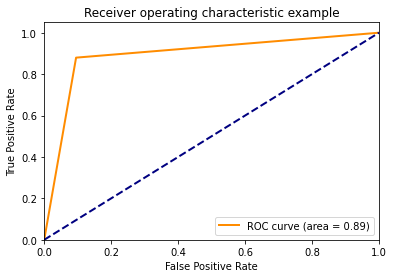

{'recall': 0.8796296296296297,
 'precision': 0.9405940594059405,
 'f1': 0.909090909090909,
 'accuracy': 0.8888888888888888,
 'auc': 0.8921957671957673}

In [50]:
metrics = evaluate(y_test, y_pred, y_proba)
metrics

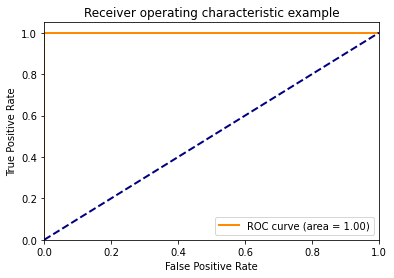

{'recall': 1.0, 'precision': 1.0, 'f1': 1.0, 'accuracy': 1.0, 'auc': 1.0}

In [51]:
# con train
y_pred = dt.predict(X_train)
y_proba = dt.predict_proba(X_train)[:,1]

evaluate(y_train, y_pred, y_proba)

### Un gran ejemplo de como puedo estropear un modelo, en este caso, esta 100% sobreajustado, ya que al comparar las metricas de el test con el train, las del train son perfectas.

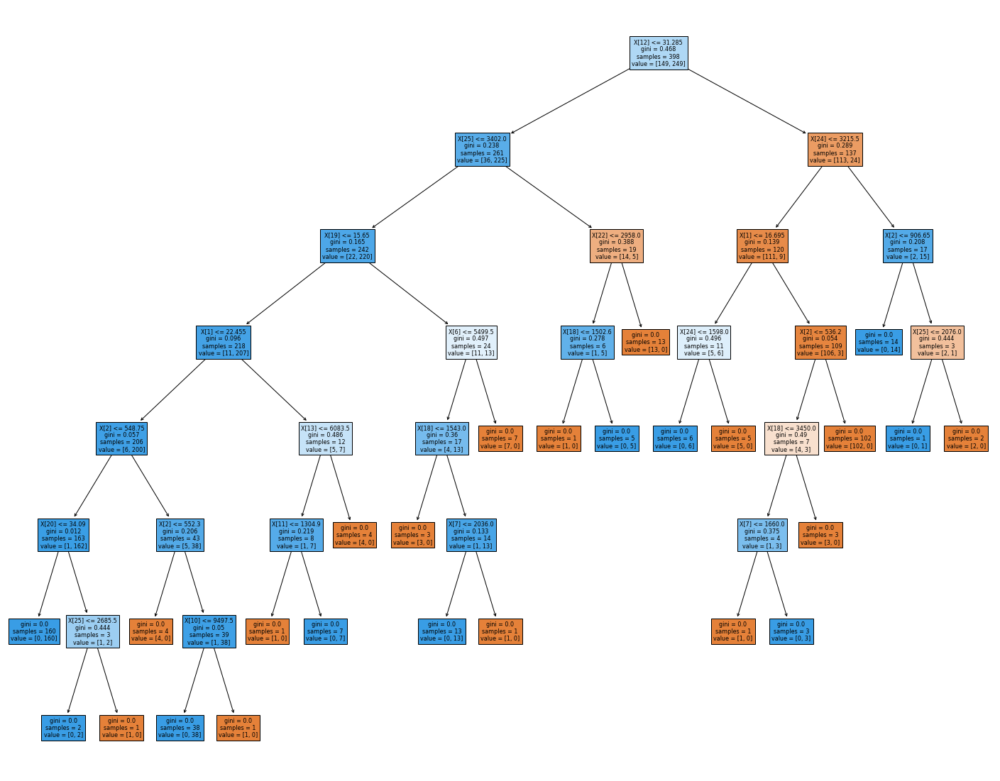

In [54]:
fig = plt.figure(figsize=(25,20))
_ = tree.plot_tree(dt, 
                   #feature_names= list(X_train.columns),  
                   #class_names= np.array(y_train.unique()),
                   filled=True)

In [55]:
dt.get_params()

{'ccp_alpha': 0.0,
 'class_weight': None,
 'criterion': 'gini',
 'max_depth': None,
 'max_features': None,
 'max_leaf_nodes': None,
 'min_impurity_decrease': 0.0,
 'min_impurity_split': None,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'random_state': None,
 'splitter': 'best'}

### Tuneo del arbol

In [56]:
model   = DecisionTreeClassifier()
scoring = {'recall': 'recall',
           'precision': 'precision',
           'f1': 'f1'}

grid = {'max_depth': np.arange(2, 7, 1)}

grid_search = GridSearchCV(estimator = model, 
                           param_grid = grid, 
                           n_jobs = -1,
                           cv = 5,
                           scoring = scoring,
                           refit = 'precision'
                           )

grid_search.fit(X_train, y_train)

GridSearchCV(cv=5, estimator=DecisionTreeClassifier(), n_jobs=-1,
             param_grid={'max_depth': array([2, 3, 4, 5, 6])},
             refit='precision',
             scoring={'f1': 'f1', 'precision': 'precision', 'recall': 'recall'})

In [57]:
print("Best: %f using %s" % (grid_search.best_score_, grid_search.best_params_))


Best: 0.904029 using {'max_depth': 4}


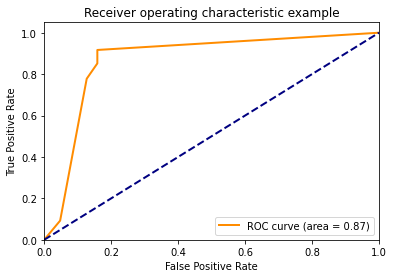

{'recall': 0.9074074074074074,
 'precision': 0.9074074074074074,
 'f1': 0.9074074074074074,
 'accuracy': 0.8830409356725146,
 'auc': 0.8688271604938271}

In [58]:
dt = DecisionTreeClassifier(**grid_search.best_params_)
dt.fit(X_train, y_train)

y_pred  = dt.predict(X_test)
y_proba = dt.predict_proba(X_test)[:,1]
evaluate(y_test, y_pred, y_proba)

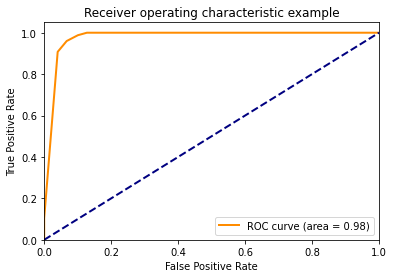

{'recall': 0.9879518072289156,
 'precision': 0.9425287356321839,
 'f1': 0.9647058823529412,
 'accuracy': 0.9547738693467337,
 'auc': 0.977291717204388}

In [59]:
# Con train

y_pred  = dt.predict(X_train)
y_proba = dt.predict_proba(X_train)[:,1]
evaluate(y_train, y_pred, y_proba)


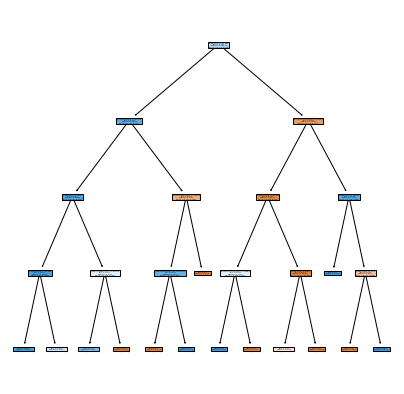

In [60]:
fig = plt.figure(figsize=(7, 7))
_ = tree.plot_tree(dt, 
                   feature_names= list(X_train.columns),  
                   #class_names= np.array(y_train.unique()),
                   filled=True, 
                   proportion = True
                  )

In [63]:
joblib.dump(dt, path + 'MODELOS/decision_tree.pkl')

['C:/Users/santi/Desktop/Docs Santi/Prueba Tecnica Davinci/MODELOS/decision_tree.pkl']

### En este caso solo con tunear el hiperparametro 'max_depth' podemos ver una gran diferencia, por lo regular en los arboles, esta es la variable que los sobreajusta, pues al querer explicar toda la varianza, hace tantas particiones puedan explicarlas.

## Bagging y tuneo de una vez

In [86]:
seed = 8
tree = DecisionTreeClassifier(max_depth = 4)
num_trees = 500

# Para entrenar el bagging, primero se llama el arbol de decisión, usaré el tuneo del modelo anterior para tenerlo en cuenta
# que fue un arbol de produndidad 4, para posteior a esto, tunerar el bagging

model_bagg = BaggingClassifier(base_estimator = tree,
                              n_estimators = num_trees,
                              random_state = seed)

In [87]:
model   = model_bagg
scoring = {'recall': 'recall',
           'precision': 'precision',
           'f1': 'f1'}

grid = {'base_estimator__max_depth': np.arange(2, 7, 1),
        'base_estimator__min_samples_leaf': np.arange(0, 20, 5), 
        'n_estimators' : np.arange(0, 500, 50)}

grid_search = GridSearchCV(estimator = model, 
                           param_grid = grid, 
                           n_jobs = -1,
                           cv = 5,
                           scoring = scoring,
                           refit = 'precision'
                           )

grid_search.fit(X_train, y_train)

GridSearchCV(cv=5,
             estimator=BaggingClassifier(base_estimator=DecisionTreeClassifier(max_depth=4),
                                         n_estimators=500, random_state=8),
             n_jobs=-1,
             param_grid={'base_estimator__max_depth': array([2, 3, 4, 5, 6]),
                         'base_estimator__min_samples_leaf': array([ 0,  5, 10, 15]),
                         'n_estimators': array([  0,  50, 100, 150, 200, 250, 300, 350, 400, 450])},
             refit='precision',
             scoring={'f1': 'f1', 'precision': 'precision', 'recall': 'recall'})

### Cuando se tunea mas de 1 hiperparametro, ya los tiempos de corrida son mas largos.

In [88]:
print("Best: %f using %s" % (grid_search.best_score_, grid_search.best_params_))

Best: 0.931168 using {'base_estimator__max_depth': 6, 'base_estimator__min_samples_leaf': 5, 'n_estimators': 200}


In [89]:
seed = 8
tree = DecisionTreeClassifier(max_depth = 5,
                              min_samples_leaf = 5)
num_trees = 200

bag = BaggingClassifier(base_estimator = tree,
                        n_estimators = num_trees,
                        random_state = seed)

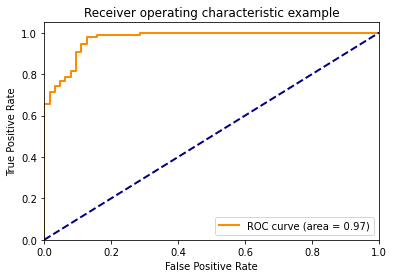

{'recall': 0.9722222222222222,
 'precision': 0.9292035398230089,
 'f1': 0.9502262443438914,
 'accuracy': 0.935672514619883,
 'auc': 0.9717813051146383}

In [90]:
bag.fit(X_train, y_train)

y_pred  = bag.predict(X_test)
y_proba = bag.predict_proba(X_test)[:,1]
evaluate(y_test, y_pred, y_proba)

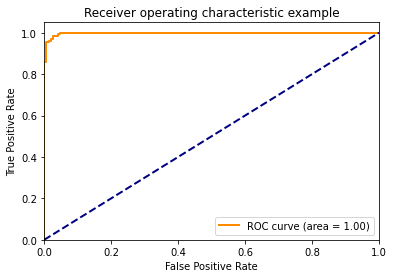

{'recall': 1.0,
 'precision': 0.9688715953307393,
 'f1': 0.9841897233201581,
 'accuracy': 0.9798994974874372,
 'auc': 0.9980054445971807}

In [91]:
## Con el test

y_pred  = bag.predict(X_train)
y_proba = bag.predict_proba(X_train)[:,1]
evaluate(y_train, y_pred, y_proba)

### En este caso, el bagging esta presentando un muy buen nivel de clasificación, no esta sobreajustado pues el salto de metricas del test al train es poca, y al el test presentar un recall del casi 98% lo mas probable es que el el train suba a 100, y eso es lo que pasa.

In [92]:
joblib.dump(bag, path + 'MODELOS/bagging_tree.pkl')

['C:/Users/santi/Desktop/Docs Santi/Prueba Tecnica Davinci/MODELOS/bagging_tree.pkl']

### Random Forest y tuneo de una vez ya que se va a sobreajustar por lo que hemos visto cos los arboles

### Tuneo basado en out of bag score (OOB):

El OOB se calcula sobre datos que no se utilizaron necesariamente en el análisis del modelo. Mientras que para la puntuación de validación cruzada, una parte del conjunto de datos de entrenamiento original se reserva antes de entrenar los modelos. Además, la puntuación OOB se calcula utilizando solo un subconjunto de DT que no contienen la muestra OOB en su conjunto de datos de entrenamiento de arranque. Mientras que la puntuación de validación cruzada se calcula utilizando todos los DT del conjunto.

Valor óptimo de n_estimators: 66


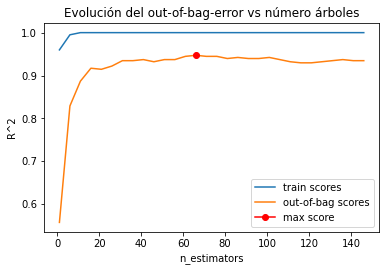

In [99]:
# Validación empleando el Out-of-Bag error
# ==============================================================================
train_scores = []
oob_scores   = []

# Valores evaluados
estimator_range = range(1, 150, 5)

# Bucle para entrenar un modelo con cada valor de n_estimators y extraer su error
# de entrenamiento y de Out-of-Bag.
for n_estimators in estimator_range:
    modelo = RandomForestClassifier(
                n_estimators = n_estimators,
                #max_depth    = None,
                #max_features = 'auto',
                oob_score    = True,
                n_jobs       = -1,
                random_state = 123
             )
    modelo.fit(X_train, y_train)
    train_scores.append(modelo.score(X_train, y_train))
    oob_scores.append(modelo.oob_score_)
    
# Gráfico con la evolución de los errores
fig, ax = plt.subplots(figsize=(6, 3.84))
ax.plot(estimator_range, train_scores, label="train scores")
ax.plot(estimator_range, oob_scores, label="out-of-bag scores")
ax.plot(estimator_range[np.argmax(oob_scores)], max(oob_scores),
        marker='o', color = "red", label="max score")
ax.set_ylabel("R^2")
ax.set_xlabel("n_estimators")
ax.set_title("Evolución del out-of-bag-error vs número árboles")
plt.legend();
print(f"Valor óptimo de n_estimators: {estimator_range[np.argmax(oob_scores)]}")

In [152]:
# Grid de hiperparámetros evaluados
# ==============================================================================
param_grid = ParameterGrid(
                {'n_estimators': [50, 100, 120], # número de árboles incluidos en el modelo.
                 'max_features': [5, 7, 9],      # número de predictores considerados a en cada división
                 'min_samples_leaf': np.arange(10, 41, 5),
                 "min_samples_split" : np.arange(5, 30 + 1, 5),
                 'max_depth'   : [1, 3, 4, 5],   # profundidad máxima que pueden alcanzar los árboles.
                 'criterion'   : ['gini', 'entropy'] 
                }
            )

# Loop para ajustar un modelo con cada combinación de hiperparámetros
# ==============================================================================
resultados = {'params': [], 'oob_accuracy': []}

for params in param_grid:
    
    modelo = RandomForestClassifier(
                oob_score    = True,
                n_jobs       = -1,
                random_state = 123,
                ** params
             )
    
    modelo.fit(X_train, y_train)
    
    resultados['params'].append(params)
    resultados['oob_accuracy'].append(modelo.oob_score_)
    #print(f"Modelo: {params} \u2713")

# Resultados
# ==============================================================================
resultados = pd.DataFrame(resultados)
resultados = pd.concat([resultados, resultados['params'].apply(pd.Series)], axis=1)
resultados = resultados.sort_values('oob_accuracy', ascending=False)
resultados = resultados.drop(columns = 'params')
resultados.head(4)

,oob_accuracy,criterion,max_depth,max_features,min_samples_leaf,min_samples_split,n_estimators
2657,0.934673,entropy,5,5,10,20,120
2648,0.934673,entropy,5,5,10,5,120
2651,0.934673,entropy,5,5,10,10,120
2654,0.934673,entropy,5,5,10,15,120


### Hagamoslo con validacion cruzada, en este caso el tiempo de procesamiento será mayor

In [105]:
# Grid de hiperparámetros evaluados
# ==============================================================================
param_grid = {'n_estimators': [100, 120, 150],
              'max_features': [5, 7, 9 12],
              'min_samples_leaf': np.arange(10, 41, 5),
              "min_samples_split" : np.arange(5, 30 + 1, 5),
              'max_depth'   : [2, 3, 4],
              'criterion'   : ['gini', 'entropy']
             }

# Búsqueda por grid search con validación cruzada
# ==============================================================================
grid = GridSearchCV(
        estimator  = RandomForestClassifier(random_state = 123),
        param_grid = param_grid,
        scoring    = 'precision',
        n_jobs     = multiprocessing.cpu_count() - 1,
        cv         = RepeatedKFold(n_splits=5, n_repeats=3, random_state=123), 
        refit      = True,
        verbose    = 0,
        return_train_score = True
       )

grid.fit(X = X_train, y = y_train)

# Resultados
# ==============================================================================
resultados = pd.DataFrame(grid.cv_results_)
resultados.filter(regex = '(param*|mean_t|std_t)') \
    .drop(columns = 'params') \
    .sort_values('mean_test_score', ascending = False) \
    .head(4)

,param_criterion,param_max_depth,param_min_samples_leaf,param_min_samples_split,param_n_estimators,mean_test_score,std_test_score,mean_train_score,std_train_score
639,entropy,4,10,20,100,0.917057,0.035468,0.963361,0.006636
630,entropy,4,10,5,100,0.917057,0.035468,0.963361,0.006636
633,entropy,4,10,10,100,0.917057,0.035468,0.963361,0.006636
636,entropy,4,10,15,100,0.917057,0.035468,0.963361,0.006636


In [107]:
# Mejores hiperparámetros por validación cruzada
# ==============================================================================
print("----------------------------------------")
print("Mejores hiperparámetros encontrados (cv)")
print("----------------------------------------")
print(grid.best_params_, ":", grid.best_score_, grid.scoring)

----------------------------------------
Mejores hiperparámetros encontrados (cv)
----------------------------------------
{'criterion': 'entropy', 'max_depth': 4, 'min_samples_leaf': 10, 'min_samples_split': 5, 'n_estimators': 100} : 0.9170569620253165 accuracy


### Entonces voy a escoger un mix de parametros entre el out of bag y la validacion cruzada

In [109]:
rf = RandomForestClassifier(n_estimators      = 110,
                            max_features      = 7  ,
                            min_samples_leaf  = 10 ,
                            min_samples_split = 20 ,
                            max_depth         = 5  ,
                            random_state      = 123)

In [111]:
print(rf)

RandomForestClassifier(max_depth=5, max_features=7, min_samples_leaf=10,
                       min_samples_split=20, n_estimators=110,
                       random_state=123)


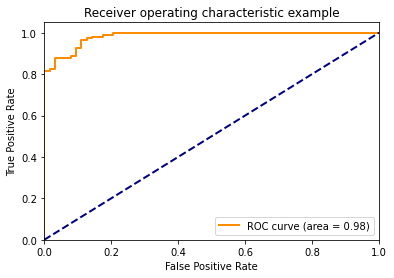

{'recall': 0.9722222222222222,
 'precision': 0.9210526315789473,
 'f1': 0.9459459459459458,
 'accuracy': 0.9298245614035088,
 'auc': 0.9836860670194003}

In [115]:
rf.fit(X_train, y_train)

y_pred = rf.predict(X_test)
y_proba = rf.predict_proba(X_test)[:,1]

metrics = evaluate(y_test, y_pred, y_proba)
metrics

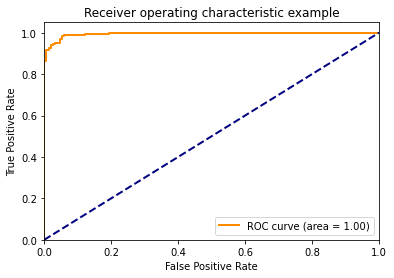

{'recall': 0.9839357429718876,
 'precision': 0.9645669291338582,
 'f1': 0.9741550695825051,
 'accuracy': 0.9673366834170855,
 'auc': 0.9951214252985094}

In [117]:
# con train
y_pred = rf.predict(X_train)
y_proba = rf.predict_proba(X_train)[:,1]
evaluate(y_train, y_pred, y_proba)

In [118]:
dump(rf, path + 'MODELOS/random_forest.pkl')

['C:/Users/santi/Desktop/Docs Santi/Prueba Tecnica Davinci/MODELOS/random_forest.pkl']

### El modelo tiene muy buenas metricas, y no presenta sobreajuste, quedo bien tuneado.. Ahora vamos a comparar nuestros 5 modelo y vamos a decidir cual seleccionar como el mejor modelo.

## Comparación de modelos.

In [139]:
lr   = load( path + 'MODELOS/logistic_regression.pkl')
lr_r = load( path + 'MODELOS/logistic_regression_regularized.pkl')
dt   = load( path + 'MODELOS/decision_tree.pkl')
bagg = load( path + 'MODELOS/bagging_tree.pkl')
rf   = load( path + 'MODELOS/random_forest.pkl')

Compararemos los modelos con una manera interesante de hacerlo, vamos a realizar una comparación de boxplots por cada metrica evaluada con el cross_val_score que nos permite evaluar la puntuación mediante validación cruzada de cada modelo

## Accuracy

LR: 0.907115 (0.051234)
LRR: 0.894487 (0.048502)
DT: 0.889615 (0.058083)
BAGGING: 0.932244 (0.053657)
RF: 0.912244 (0.061390)


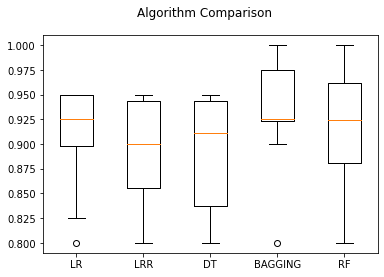

In [140]:
seed = 7

# prepare models
models = []
models.append( ('LR', lr) )
models.append( ('LRR', lr_r) )
models.append( ('DT', dt) )
models.append( ('BAGGING', bagg) )
models.append( ('RF', rf) )

# evaluate each model in turn
results = []
names = []
scoring = 'accuracy'

for name, model in models:
    kfold = KFold(n_splits = 10, shuffle = True, random_state = seed)
    cv_results = cross_val_score(model, X_train, y_train, cv = kfold, scoring = scoring)
    results.append(cv_results)
    names.append(name)
    msg = "%s: %f (%f)" % (name, cv_results.mean(), cv_results.std())
    print(msg)
    
# boxplot algorithm comparison
fig = plt.figure()
fig.suptitle('Algorithm Comparison')
ax = fig.add_subplot(111)
plt.boxplot(results)
ax.set_xticklabels(names)
plt.show()

## Precision

LR: 0.912045 (0.050856)
LRR: 0.906102 (0.036080)
DT: 0.883924 (0.069733)
BAGGING: 0.929643 (0.064026)
RF: 0.913119 (0.056133)


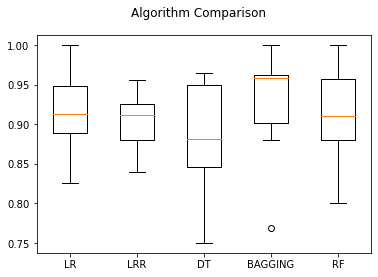

In [142]:
seed = 7
# prepare models
models = []
models.append( ('LR', lr) )
models.append( ('LRR', lr_r) )
models.append( ('DT', dt) )
models.append( ('BAGGING', bagg) )
models.append( ('RF', rf) )

# evaluate each model in turn
results = []
names = []
scoring = 'precision'

for name, model in models:
    kfold = KFold(n_splits = 10, shuffle = True, random_state = seed)
    cv_results = cross_val_score(model, X_train, y_train, cv = kfold, scoring = scoring)
    results.append(cv_results)
    names.append(name)
    msg = "%s: %f (%f)" % (name, cv_results.mean(), cv_results.std())
    print(msg)
    
# boxplot algorithm comparison
fig = plt.figure()
fig.suptitle('Algorithm Comparison')
ax = fig.add_subplot(111)
plt.boxplot(results)
ax.set_xticklabels(names)
plt.show()

## Recall

LR: 0.942520 (0.053732)
LRR: 0.927257 (0.052324)
DT: 0.939148 (0.048832)
BAGGING: 0.962047 (0.039947)
RF: 0.945880 (0.063151)


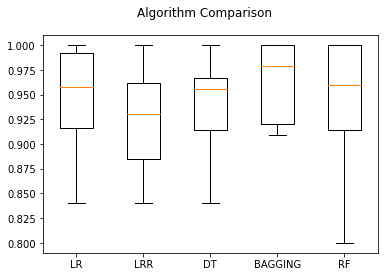

In [143]:
seed = 7
# prepare models
models = []
models.append( ('LR', lr) )
models.append( ('LRR', lr_r) )
models.append( ('DT', dt) )
models.append( ('BAGGING', bagg) )
models.append( ('RF', rf) )

# evaluate each model in turn
results = []
names = []
scoring = 'recall'

for name, model in models:
    kfold = KFold(n_splits = 10, shuffle = True, random_state = seed)
    cv_results = cross_val_score(model, X_train, y_train, cv = kfold, scoring = scoring)
    results.append(cv_results)
    names.append(name)
    msg = "%s: %f (%f)" % (name, cv_results.mean(), cv_results.std())
    print(msg)
    
# boxplot algorithm comparison
fig = plt.figure()
fig.suptitle('Algorithm Comparison')
ax = fig.add_subplot(111)
plt.boxplot(results)
ax.set_xticklabels(names)
plt.show()

## f1 Score

LR: 0.926184 (0.043492)
LRR: 0.916168 (0.040168)
DT: 0.910000 (0.046046)
BAGGING: 0.944506 (0.045202)
RF: 0.928208 (0.052177)


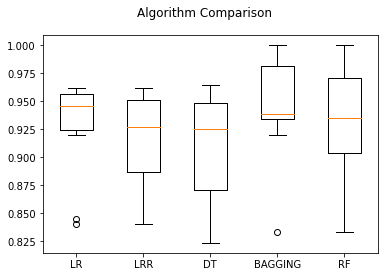

In [144]:
seed = 7
# prepare models
models = []
models.append( ('LR', lr) )
models.append( ('LRR', lr_r) )
models.append( ('DT', dt) )
models.append( ('BAGGING', bagg) )
models.append( ('RF', rf) )

# evaluate each model in turn
results = []
names = []
scoring = 'f1'

for name, model in models:
    kfold = KFold(n_splits = 10, shuffle = True, random_state = seed)
    cv_results = cross_val_score(model, X_train, y_train, cv = kfold, scoring = scoring)
    results.append(cv_results)
    names.append(name)
    msg = "%s: %f (%f)" % (name, cv_results.mean(), cv_results.std())
    print(msg)
    
# boxplot algorithm comparison
fig = plt.figure()
fig.suptitle('Algorithm Comparison')
ax = fig.add_subplot(111)
plt.boxplot(results)
ax.set_xticklabels(names)
plt.show()

### Seleccion de modelo:

Al analizar los 4 indicadores, recall, precision, accuracy y f1 Score, el **Bagging y el random forest** fueron los modelos que tuvieron el mejor desempeño. 

Se selecciona el **Bagging** como el mejor modelo, si bien tiene algunos puntos atipicos en la validación cruzada, los resultados de las metricas son consistentes y es uno de los modelos con **menor variabilidad y mejores indicadores**

**Modelo bagging:** 

Este tienen como objetivo la reducción de la varianza: sobre diferentes muestras aleatorias del set de entrenamiento se obtienen modelos predictivos simples diferentes. Por último, se ensamblan todos ellos en un único modelo, que es el promedio de los anteriores (en casos de regresión) o el más votado (en casos de clasificación).

Este algoritmo es especialmente recomendable en modelos con alta varianza (en caso contrario no mejora significativamente los resultados). Además, reduce el sobreaprendizaje ya que cada modelo simple es independiente del anterior, con muestras aleatorias diferentes.(1)

El Random forest es una técnica que emplea el bagging, pero además de emplear muestras aleatorias en cada paso, también utiliza diferentes variables. 

Que en nuestro caso, ensamblamos el arbol de decisión, el cual presentaba buenas metricas y tuvo un buen comportamiento .

*(1) Pérez, S. C., & Carranza, R. G. Clasificación de e-mails: Detección de Spam.*